# Pilot: Adding fish detection to the pipeline

As a very low effort pilot, use [a pre-trained fish detection model](https://github.com/rocapal/fish_detection) that's based on YOLOv3 to label my own photos.

# TODO

* Check that the Darknet params make sense (`-i 0`?)
* Document & tidy up the notebook
* Make an issue with next steps: probably a better detector and more solid pipeline; potentially apply detector in training as well; add CLI for batch-mode cropping and labelling of trip photos (figure out a good output interface)

In [2]:
import json
from pathlib import Path

from matplotlib import pyplot as plt
import pandas as pd
from PIL import Image, ImageDraw

%config InlineBackend.figure_format = 'retina'

## One-off setup for the fish detection repo

```
# Clone the repos
$ cd ~/projects
$ git clone git@github.com:rocapal/fish_detection.git
$ cd fish_detection
$ git clone git@github.com:AlexeyAB/darknet

# Build Darknet with GPU (about x100 speedup in detection time)
$ cd darknet
$ vi Makefile  # set GPU=1 and OPENCV=1
$ make
$ cd ..

# Get the pretrained model and setup the data files, skipping train.txt since we're not really training
$ wget https://www.dropbox.com/s/gmw2774nrsw7ovk/yolov3-obj_30000.weights
$ mkdir data-fish; cd data-fish/
$ echo "fish" > obj.names
$ echo "classes= 1
train  = data-fish/train.txt
valid  = data-fish/train.txt 
names = data-fish/obj.names
backup = backup/" > obj.data
```

## Run the detector on my demo images and play with the results

This was before I found out about FiftyOne, which can obviate a lot of messing around with images.

In [1]:
%%bash

cd ~/projects/fish_detection
ls ~/projects/deep-fish/data/demo/*.JPG | \
    ./darknet/darknet detector test \
        data-fish/obj.data yolov3-obj.cfg yolov3-obj_30000.weights \
        -thresh 0.01 -i 0 -ext_output -dont_show \
        -out ~/projects/deep-fish/data/demo/yolov3-pilot-results.json

net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
Create CUDA-stream - 0 

 seen 64, trained: 1920 K-images (30 Kilo-batches_64) 
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/projects/deep-fish/data/demo/P6204455.JPG: Predicted in 711.509000 milli-seconds.
fish: 100%	(left_x: 1324   top_y:  264   width: 1198   height: 2418)
fish: 1%	(left_x: 2005   top_y: 2694   width:   49   height:   80)
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/projects/deep-fish/data/demo/P6204469.JPG: Predicted in 53.568000 milli-seconds.
fish: 100%	(left_x:   79   top_y: 1449   width:  580   height:  282)
fish: 92%	(left_x: 1106   top_y:  966   width:  259   height:  121)
fish: 90%	(left_x: 1684   top_y: 1367   width:  256   height:  150)
fish: 95%	(left_x: 1927   top_y:  979   width:  253   height:  330)
f

 CUDA-version: 10010 (11020), GPU count: 1  
 OpenCV version: 4.2.0
Cannot load image data/labels/32_0.png
Cannot load image data/labels/33_0.png
Cannot load image data/labels/34_0.png
Cannot load image data/labels/35_0.png
Cannot load image data/labels/36_0.png
Cannot load image data/labels/37_0.png
Cannot load image data/labels/38_0.png
Cannot load image data/labels/39_0.png
Cannot load image data/labels/40_0.png
Cannot load image data/labels/41_0.png
Cannot load image data/labels/42_0.png
Cannot load image data/labels/43_0.png
Cannot load image data/labels/44_0.png
Cannot load image data/labels/45_0.png
Cannot load image data/labels/46_0.png
Cannot load image data/labels/47_0.png
Cannot load image data/labels/48_0.png
Cannot load image data/labels/49_0.png
Cannot load image data/labels/50_0.png
Cannot load image data/labels/51_0.png
Cannot load image data/labels/52_0.png
Cannot load image data/labels/53_0.png
Cannot load image data/labels/54_0.png
Cannot load image data/labels/55_0.

In [3]:
!cat ~/projects/deep-fish/data/demo/yolov3-pilot-results.json

[
{
 "frame_id":1, 
 "filename":"/home/yanir/projects/deep-fish/data/demo/P6204455.JPG", 
 "objects": [ 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.480839, "center_y":0.491156, "width":0.299516, "height":0.806030}, "confidence":0.998644}, 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.507326, "center_y":0.911161, "width":0.012350, "height":0.026525}, "confidence":0.011210}
 ] 
}, 
{
 "frame_id":2, 
 "filename":"/home/yanir/projects/deep-fish/data/demo/P6204469.JPG", 
 "objects": [ 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.743633, "center_y":0.240916, "width":0.193879, "height":0.114422}, "confidence":0.999842}, 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.122669, "center_y":0.704644, "width":0.192967, "height":0.125007}, "confidence":0.999839}, 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.683372, "center_y":0.507107, "width":0.084308, "height":0.146497}, "confi

In [21]:
def read_results_from_json(json_path):
    with open(json_path) as results_fp:
        flat_boxes = [
            [frame['filename'], bbox['confidence']] + list(bbox['relative_coordinates'].values())
            for frame in json.load(results_fp)
            for bbox in frame['objects']
        ]
    return pd.DataFrame(flat_boxes, columns=['filename', 'confidence', 'center_x', 'center_y', 'width', 'height'])

In [5]:
demo_bboxes = read_results_from_json('/home/yanir/projects/deep-fish/data/demo/yolov3-pilot-results.json')
demo_bboxes

,filename,confidence,center_x,center_y,width,height
0,/home/yanir/projects/deep-fish/data/demo/P6204...,0.998644,0.480839,0.491156,0.299516,0.806030
1,/home/yanir/projects/deep-fish/data/demo/P6204...,0.011210,0.507326,0.911161,0.012350,0.026525
2,/home/yanir/projects/deep-fish/data/demo/P6204...,0.999842,0.743633,0.240916,0.193879,0.114422
3,/home/yanir/projects/deep-fish/data/demo/P6204...,0.999839,0.122669,0.704644,0.192967,0.125007
4,/home/yanir/projects/deep-fish/data/demo/P6204...,0.951735,0.683372,0.507107,0.084308,0.146497
5,/home/yanir/projects/deep-fish/data/demo/P6204...,0.917481,0.411023,0.454930,0.086144,0.053756
6,/home/yanir/projects/deep-fish/data/demo/P6204...,0.900838,0.602737,0.639172,0.085252,0.066662
7,/home/yanir/projects/deep-fish/data/demo/P6204...,0.877369,0.936759,0.638848,0.081198,0.086684
8,/home/yanir/projects/deep-fish/data/demo/P6204...,0.088933,0.562841,0.418919,1.017938,0.902092
9,/home/yanir/projects/deep-fish/data/demo/P6204...,0.013514,0.497821,0.558569,0.322192,0.184479


In [7]:
filename, confidence, center_x, center_y, width, height = demo_bboxes.iloc[0]

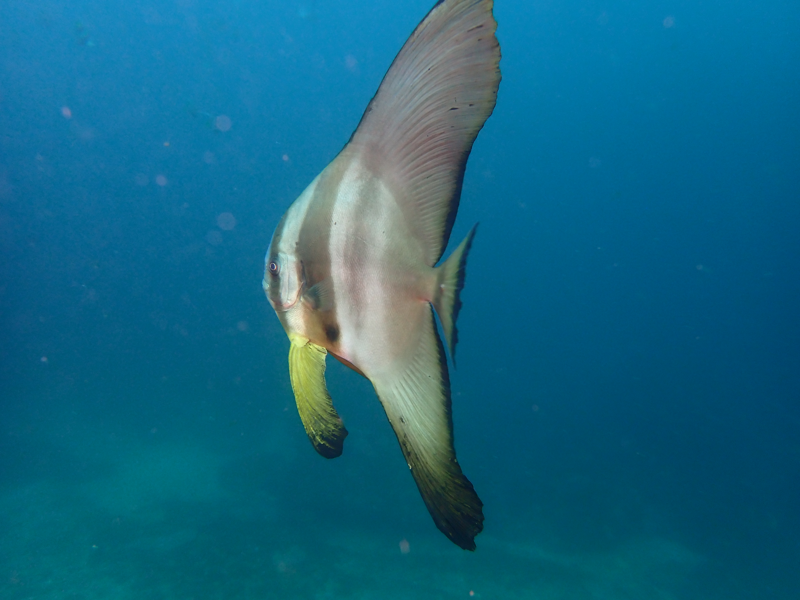

In [8]:
img = Image.open(filename)
resized_img = img.resize([edge // 5 for edge in img.size])
resized_img

In [9]:
def get_rect(img, center_x, center_y, width, height, flatten=False):
    left = max(0, int((center_x - width / 2) * img.width))
    right = min(img.width - 1, int((center_x + width / 2) * img.width))
    top = max(0, int((center_y - height / 2) * img.height))
    bottom = min(img.height - 1, int((center_y + height / 2) * img.height))
    return (left, top, right, bottom) if flatten else ((left, top), (right, bottom))

In [10]:
[
    get_rect(img, center_x, center_y, width, height),
    get_rect(img, center_x, center_y, width, height, flatten=True),
    get_rect(resized_img, center_x, center_y, width, height),
    get_rect(resized_img, center_x, center_y, width, height, flatten=True),    
]

[((1324, 264), (2522, 2682)),
 (1324, 264, 2522, 2682),
 ((264, 52), (504, 536)),
 (264, 52, 504, 536)]

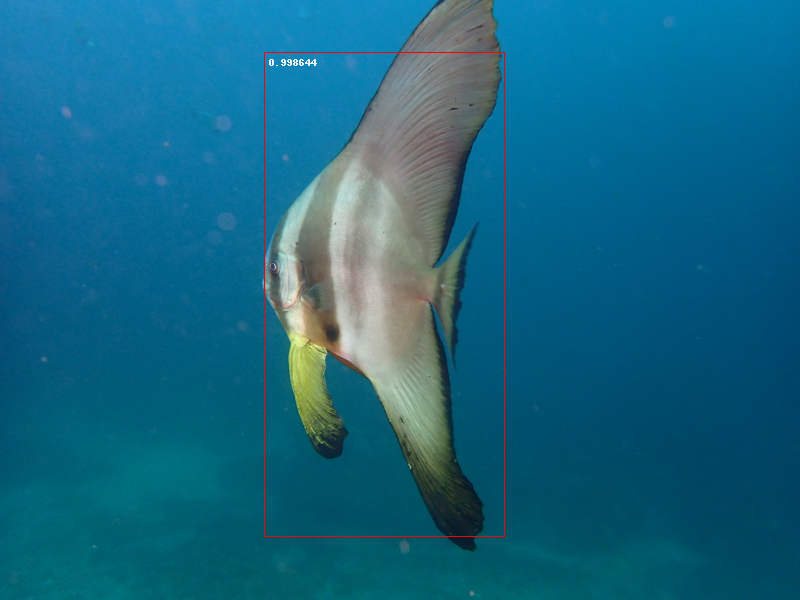

In [11]:
resized_img_copy = resized_img.copy()
img_draw = ImageDraw.Draw(resized_img_copy)
rect = get_rect(resized_img_copy, center_x, center_y, width, height)
img_draw.rectangle(rect, outline="red", width=1)
img_draw.text([x + 5 for x in rect[0]], str(confidence), fill="#eee")
resized_img_copy

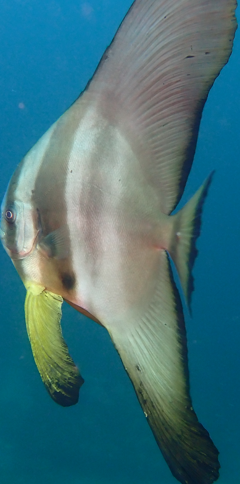

In [19]:
resized_img.crop(get_rect(resized_img, center_x, center_y, width, height, flatten=True))

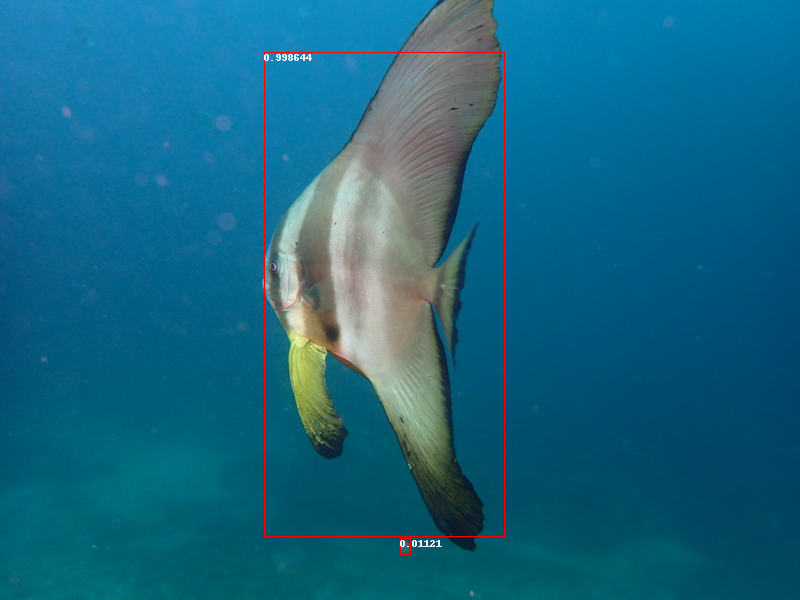

In [16]:
def draw_bboxes_for_file(bboxes, filename=None, resize_factor=5):
    if filename is None:
        filename = bboxes.sample().iloc[0].filename
    img = Image.open(filename)
    resized_img = img.resize([edge // resize_factor for edge in img.size])
    img_draw = ImageDraw.Draw(resized_img)
    for row in bboxes.query("filename == @filename").itertuples():
        rect = get_rect(resized_img, row.center_x, row.center_y, row.width, row.height)
        img_draw.rectangle(rect, outline="red", width=1)
        img_draw.text(rect[0], str(row.confidence), fill="#eee")
    return resized_img

draw_bboxes_for_file(demo_bboxes, demo_bboxes.iloc[0]["filename"])

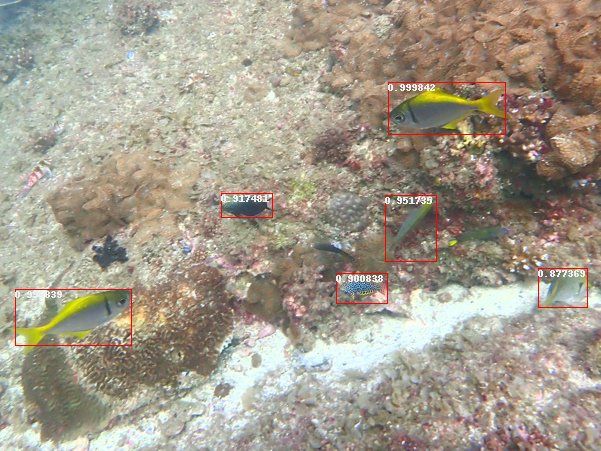

In [17]:
draw_bboxes_for_file(demo_bboxes, demo_bboxes.iloc[2]["filename"])

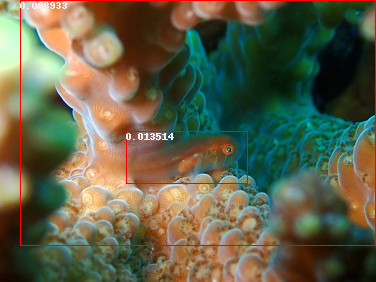

In [18]:
draw_bboxes_for_file(demo_bboxes, demo_bboxes.iloc[-1]["filename"])

In [23]:
def save_crops(bboxes, dst_dir, img_id_split_char):
    Path(dst_dir).mkdir(parents=True)
    for row in bboxes.itertuples():
        img = Image.open(row.filename)
        cropped = img.crop(get_rect(img, row.center_x, row.center_y, row.width, row.height, flatten=True))
        img_id, non_id_part = Path(img.filename).name.split(img_id_split_char, maxsplit=1)
        with open(f"{dst_dir}/{img_id}R{row.Index}{img_id_split_char}{non_id_part}", "wb") as cropped_fp:
            cropped.save(cropped_fp)

In [24]:
save_crops(demo_bboxes,
           dst_dir="/home/yanir/projects/deep-fish/data/demo-yolov3-pilot-crops",
           img_id_split_char=".")

## Run more rigorous evaluation on the Eviota 2020 dataset

This makes a significant difference in terms of accuracy@10 on full images. Definitely good enough to be usable on trips. Now it just needs to be made into an app, which is where FiftyOne may come in.

Setup                                            | accuracy@10
-------------------------------------------------|------------
Raw dataset (`03-app` notebook)                  | 6.6%
Eliminating impossible labels                    | 9.5%
Limiting to northern GBR species                 | 12.5%
Using top-3 confidence-weighted crop predictions | 25.8%

In [181]:
%%bash

cd ~/projects/fish_detection
ls ~/projects/deep-fish/data/eviota-202010/*.jpg | \
    ./darknet/darknet detector test \
        data-fish/obj.data yolov3-obj.cfg yolov3-obj_30000.weights \
        -thresh 0.01 -i 0 -ext_output -dont_show \
        -out ~/projects/deep-fish/data/eviota-202010/yolov3-pilot-results.json

net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
Create CUDA-stream - 0 

 seen 64, trained: 1920 K-images (30 Kilo-batches_64) 
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/projects/deep-fish/data/eviota-202010/PA141219-chelidonura-inornata.jpg: Predicted in 189.271000 milli-seconds.
fish: 11%	(left_x: 1596   top_y: 1294   width:  620   height:  354)
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/projects/deep-fish/data/eviota-202010/PA141223-fusigobius-duospilus.jpg: Predicted in 49.130000 milli-seconds.
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/projects/deep-fish/data/eviota-202010/PA141225-fusigobius-duospilus.jpg: Predicted in 48.861000 milli-seconds.
fish: 1%	(left_x:   -0   top_y:  560  

 CUDA-version: 10010 (11020), GPU count: 1  
 OpenCV version: 4.2.0
Cannot load image data/labels/32_0.png
Cannot load image data/labels/33_0.png
Cannot load image data/labels/34_0.png
Cannot load image data/labels/35_0.png
Cannot load image data/labels/36_0.png
Cannot load image data/labels/37_0.png
Cannot load image data/labels/38_0.png
Cannot load image data/labels/39_0.png
Cannot load image data/labels/40_0.png
Cannot load image data/labels/41_0.png
Cannot load image data/labels/42_0.png
Cannot load image data/labels/43_0.png
Cannot load image data/labels/44_0.png
Cannot load image data/labels/45_0.png
Cannot load image data/labels/46_0.png
Cannot load image data/labels/47_0.png
Cannot load image data/labels/48_0.png
Cannot load image data/labels/49_0.png
Cannot load image data/labels/50_0.png
Cannot load image data/labels/51_0.png
Cannot load image data/labels/52_0.png
Cannot load image data/labels/53_0.png
Cannot load image data/labels/54_0.png
Cannot load image data/labels/55_0.

In [22]:
eviota_bboxes = read_results_from_json('/home/yanir/projects/deep-fish/data/eviota-202010/yolov3-pilot-results.json')
eviota_bboxes.head()

,filename,confidence,center_x,center_y,width,height
0,/home/yanir/projects/deep-fish/data/eviota-202010/PA141219-chelidonura-inornata.jpg,0.114691,0.476501,0.490419,0.155122,0.117873
1,/home/yanir/projects/deep-fish/data/eviota-202010/PA141225-fusigobius-duospilus.jpg,0.071381,0.365904,0.781957,0.137059,0.306045
2,/home/yanir/projects/deep-fish/data/eviota-202010/PA141225-fusigobius-duospilus.jpg,0.042378,0.005843,0.949219,0.009950,0.048025
3,/home/yanir/projects/deep-fish/data/eviota-202010/PA141225-fusigobius-duospilus.jpg,0.030232,0.017696,0.750963,0.031221,0.213963
4,/home/yanir/projects/deep-fish/data/eviota-202010/PA141225-fusigobius-duospilus.jpg,0.021583,0.012252,0.759293,0.022015,0.125347


In [34]:
mid_confidence_eviota_bboxes = eviota_bboxes.query("confidence > 0.5")
high_confidence_eviota_bboxes = eviota_bboxes.query("confidence > 0.9")

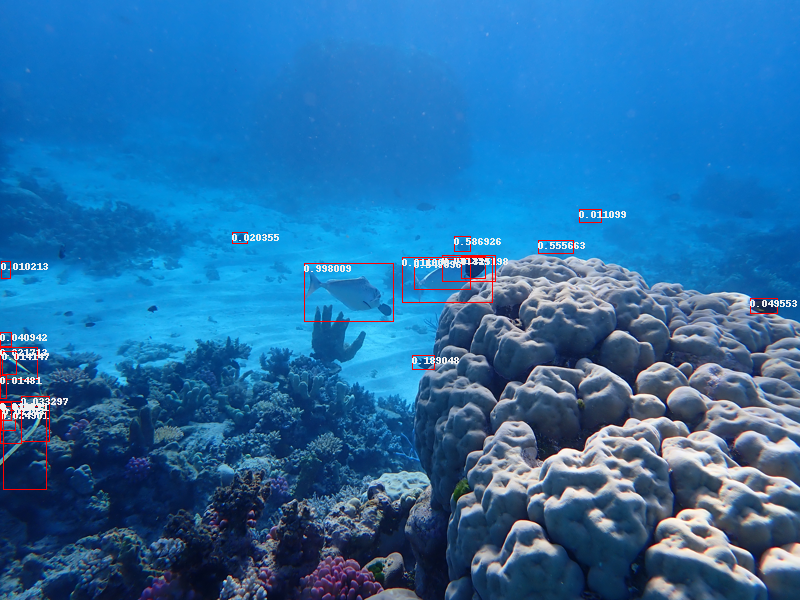

In [30]:
draw_bboxes_for_file(eviota_bboxes)

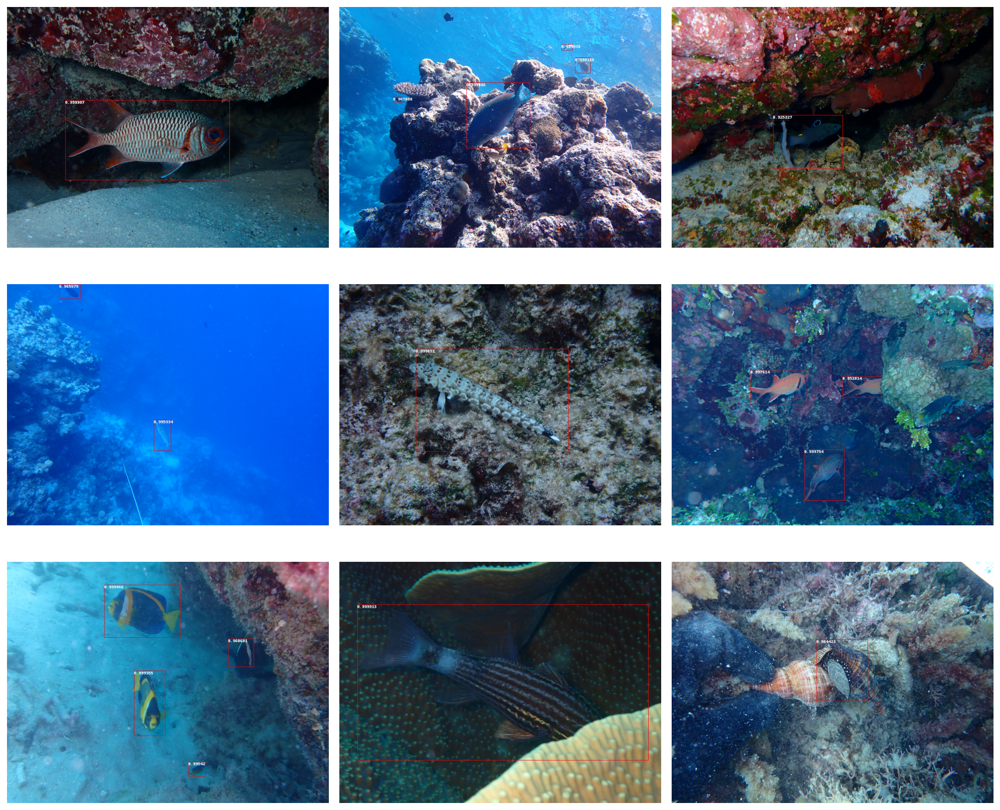

In [38]:
sample = [draw_bboxes_for_file(high_confidence_eviota_bboxes) for _ in range(9)]
for ax, img in zip(plt.subplots(3, 3, figsize=(14, 12))[1].flatten(), sample):
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()

In [40]:
save_crops(eviota_bboxes,
           dst_dir="/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/",
           img_id_split_char="-")
save_crops(high_confidence_eviota_bboxes,
           dst_dir="/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/",
           img_id_split_char="-")

In [1]:
from fastai.vision.all import *
import experiments

model_v2 = load_learner("/home/yanir/projects/deep-fish/models/app-v2.pkl", cpu=False)

In [4]:
def get_first_filename_species(path):
    return " ".join(path.name.replace(".jpg", "").split("-")[1:3]).capitalize()


def get_dataset_paths_and_labels(dataset_path):
    paths = get_image_files(dataset_path)
    labels = paths.map(get_first_filename_species)
    return paths, labels

eviota_high_confidence_files, eviota_high_confidence_labels = get_dataset_paths_and_labels(
    "/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/"
)
eviota_high_confidence_files, eviota_high_confidence_labels

((#454) [Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/PA201773R407-cirrhilabrus-punctatus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/PA242203R1013-chlorurus-sordidus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/PA141317R84-dardanus-lagopedes.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/PA242220R1219-cheilodipterus-macrodon.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/PA242257R1230-acanthurus-nigrifuscus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/PA242203R1003-chlorurus-sordidus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops-high-confidence/PA272824R1849-pseudanthias-tuka.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-cro

{'top_1_accuracy': 0.10572687536478043,
 'top_3_accuracy': 0.1629955917596817,
 'top_10_accuracy': 0.21365638077259064}

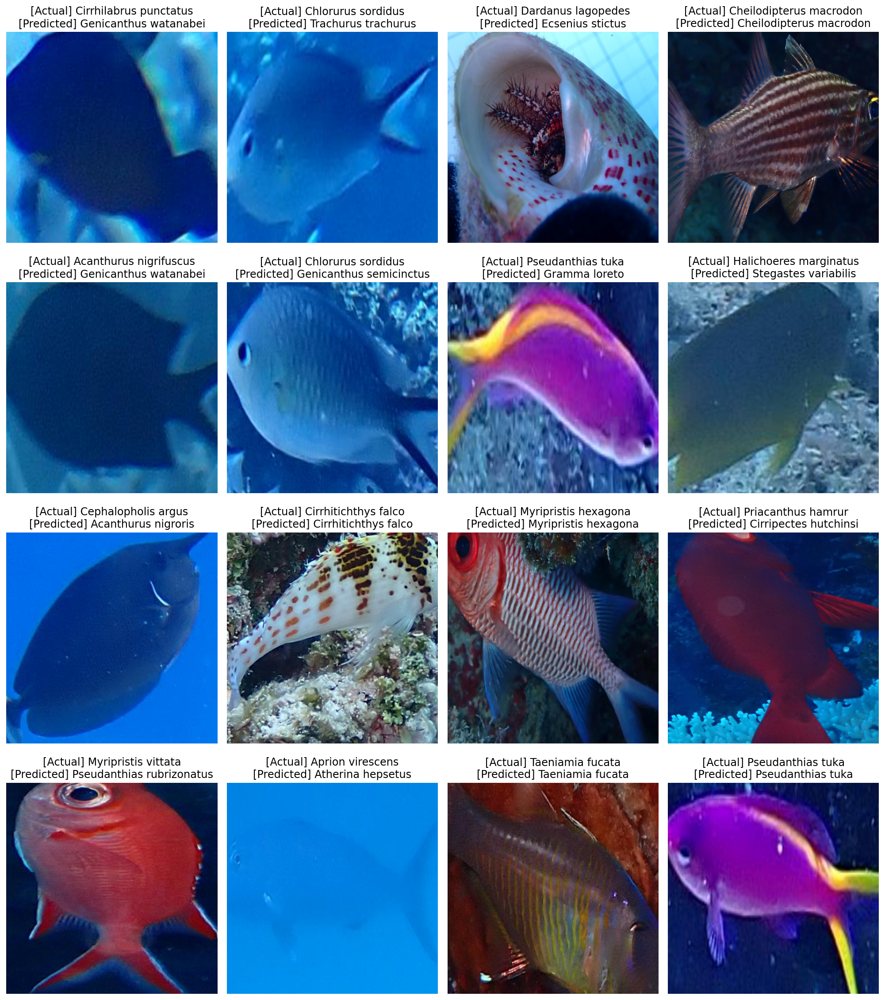

In [5]:
experiments.test_learner(model_v2, eviota_high_confidence_files, eviota_high_confidence_labels)

## Next step: Better reporting

* Map each Eviota file to:
  - Whole-image predictions
  - Crop predictions
  - Is predictable, i.e., is the first label in the vocab?
* Report the best accuracy with the current setup, going by number of crops (1, 5, 10):
  - Is the first label in the whole image?
  - Is the first label in the top crops?
  - Get results with and without area filtering, and with and without impossible predictions

In [12]:
eviota_files, eviota_labels = get_dataset_paths_and_labels("/home/yanir/projects/deep-fish/data/eviota-202010")
eviota_files, eviota_labels

((#533) [Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA211990-novaculichthys-taeniourus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA141249-maritigrella-virgulata.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA252337-scarus-frenatus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA222048-cheilodipterus-artus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA242210-siganus-corallinus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA262571-thelenota-rubralineata.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PB013362-pentapodus-paradisius.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA141274-eviota-guttata.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA181587-neocirrhites-armatus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA181623-trapezia-rufopunctata.jpg')...],
 (#533) ['Novaculichthys taeniourus','Maritigrella virgulata','Scaru

In [79]:
def remove_non_vocab_instances(paths, labels, vocab):
    included_paths = L()
    included_labels = L()
    for path, label in zip(paths, labels):
        if label in vocab:
            included_paths.append(path)
            included_labels.append(label)
    return included_paths, included_labels

legit_eviota_files_and_labels = remove_non_vocab_instances(
    *get_dataset_paths_and_labels("/home/yanir/projects/deep-fish/data/eviota-202010"),
    vocab=model_v2.dls.vocab
)
legit_eviota_files_and_labels

((#368) [Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA211990-novaculichthys-taeniourus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA252337-scarus-frenatus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA222048-cheilodipterus-artus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA242210-siganus-corallinus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA141274-eviota-guttata.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA181587-neocirrhites-armatus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA171430-myripristis-violacea.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA242255-pomacentrus-lepidogenys.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA252402-priacanthus-hamrur.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010/PA171380-myripristis-violacea.jpg')...],
 (#368) ['Novaculichthys taeniourus','Scarus frenatus','Cheilodipterus ar

In [80]:
experiments.test_learner(model_v2, *legit_eviota_files_and_labels, show_grid=False)

{'top_1_accuracy': 0.05163043364882469,
 'top_3_accuracy': 0.0625,
 'top_10_accuracy': 0.09510869532823563}

In [9]:
experiments.test_learner(
    model_v2,
    *remove_non_vocab_instances(
        eviota_high_confidence_files,
        eviota_high_confidence_labels,
        vocab=model_v2.dls.vocab
    ),
    show_grid=False
)

{'top_1_accuracy': 0.1297297328710556,
 'top_3_accuracy': 0.20000000298023224,
 'top_10_accuracy': 0.26216214895248413}

In [81]:
def get_accuracies(preds, label_codes):
    return {f"top_{k}_accuracy": top_k_accuracy(preds, label_codes, k).item() for k in (1, 3, 10)}

In [82]:
def get_preds(learner, image_paths, labels):
    test_dl = learner.dls.test_dl(image_paths)
    preds = learner.get_preds(dl=test_dl, reorder=False)[0]
    label_codes = tensor([learner.dls.vocab.o2i.get(label, -1) for label in labels])
    return preds, label_codes

legit_preds, legit_label_codes = get_preds(model_v2, *legit_eviota_files_and_labels)

In [83]:
get_accuracies(legit_preds, legit_label_codes)

{'top_1_accuracy': 0.05163043364882469,
 'top_3_accuracy': 0.0625,
 'top_10_accuracy': 0.09510869532823563}

In [42]:
import app_util

def get_ngbr_area_species():
    species_df = app_util._load_species_df("/home/yanir/projects/deep-fish/resources/api-species.json")
    site_df = app_util._load_site_df(
        "/home/yanir/projects/deep-fish/resources/api-site-surveys.json",
        species_df
    )
    return app_util.get_selected_area_info(site_df, lat=-15, lon=145, radius=750)["species_freqs"]

ngbr_area_species = get_ngbr_area_species()

2022-01-25 09:12:29.626 
  command:

    streamlit run /home/yanir/.conda/envs/deep-fish/lib/python3.9/site-packages/ipykernel_launcher.py [ARGUMENTS]


In [77]:
def zeroize_label_preds(preds, vocab, labels_to_keep):
    indices_to_zeroize = [i for i, label in enumerate(vocab.items) if label not in labels_to_keep]
    preds_with_zeros = preds.clone()
    preds_with_zeros[..., indices_to_zeroize] = 0
    return preds_with_zeros

In [84]:
get_accuracies(
    zeroize_label_preds(legit_preds, model_v2.dls.vocab, labels_to_keep=ngbr_area_species),
    legit_label_codes
)

{'top_1_accuracy': 0.05163043364882469,
 'top_3_accuracy': 0.0679347813129425,
 'top_10_accuracy': 0.125}

In [85]:
legit_eviota_crops_and_labels = remove_non_vocab_instances(
    *get_dataset_paths_and_labels("/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops"),
    vocab=model_v2.dls.vocab
)
legit_eviota_crops_and_labels

((#2103) [Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/PA242203R1054-chlorurus-sordidus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/PA211978R694-chromis-ternatensis.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/PA272808R1778-chromis-weberi.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/PA303076R2177-ecsenius-mandibularis.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/PA272719R1716-chlorurus-microrhinos.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/PA222037R831-zoramia-viridiventer.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/PB013363R2521-fusigobius-duospilus.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-crops/PA272707R1630-pterocaesio-trilineata.jpg'),Path('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-pilot-

In [86]:
legit_crop_preds, legit_crop_label_codes = get_preds(model_v2, *legit_eviota_crops_and_labels)

In [87]:
get_accuracies(
    zeroize_label_preds(legit_crop_preds, model_v2.dls.vocab, labels_to_keep=ngbr_area_species),
    legit_crop_label_codes
)

{'top_1_accuracy': 0.031859248876571655,
 'top_3_accuracy': 0.05040418356657028,
 'top_10_accuracy': 0.07845934480428696}

In [146]:
def amend_preds_with_crops(
    bboxes,
    full_paths,
    full_preds,
    crop_paths,
    crop_preds,
    top_k=1
):
    """
    For each image:
     - if there are any crops, use the top_k crop predictions, weighted by confidence
     - if there are no crops, use the overall image prediction
    """
    bboxes = bboxes.sort_values(["filename", "confidence"], ascending=[True, False])
    crop_id_to_index = {path.name.split('-')[0]: i for i, path in enumerate(crop_paths)}
    preds = full_preds.clone()
    for full_index, full_path in enumerate(full_paths):
        full_bboxes = bboxes.query(f"filename == '{full_path}'")
        if full_bboxes.empty:
            continue
        preds[full_index] = 0
        for bbox_row in full_bboxes.iloc[:top_k].itertuples():
            crop_id = f"{full_path.name.split('-')[0]}R{bbox_row.Index}"
            preds[full_index] += bbox_row.confidence * crop_preds[crop_id_to_index[crop_id]]
    return preds

for k in (1, 3, 10):
    amended_preds = amend_preds_with_crops(
        bboxes=eviota_bboxes,
        full_paths=legit_eviota_files_and_labels[0],
        full_preds=zeroize_label_preds(legit_preds, model_v2.dls.vocab, labels_to_keep=ngbr_area_species),
        crop_paths=legit_eviota_crops_and_labels[0],
        crop_preds=zeroize_label_preds(legit_crop_preds, model_v2.dls.vocab, labels_to_keep=ngbr_area_species),
        top_k=k,
    )
    print(f"k={k}\t{get_accuracies(amended_preds, legit_label_codes)}")

k=1	{'top_1_accuracy': 0.1195652186870575, 'top_3_accuracy': 0.18478260934352875, 'top_10_accuracy': 0.24184782803058624}
k=3	{'top_1_accuracy': 0.11413043737411499, 'top_3_accuracy': 0.1820652186870575, 'top_10_accuracy': 0.25815218687057495}
k=10	{'top_1_accuracy': 0.11684782803058624, 'top_3_accuracy': 0.18478260934352875, 'top_10_accuracy': 0.2554347813129425}


## Hackily add the specific detections to the FiftyOne dataset

**TODO**: Need to figure out how to best show them, possibly normalise the probabilities to make filtering feasible

In [175]:
import fiftyone as fo

In [177]:
dataset = fo.load_dataset("eviota-2020")

In [183]:
yolov3_pilot_fish_classifications = {}
for crop_path, crop_path_preds in zip(
    legit_eviota_crops_and_labels[0],
    zeroize_label_preds(legit_crop_preds, model_v2.dls.vocab, labels_to_keep=ngbr_area_species)
):
    top_crop_preds = pd.Series(
        dict(zip(model_v2.dls.vocab, map(float, crop_path_preds)))
    ).sort_values(ascending=False).head(10)
    crop_row = eviota_bboxes.loc[int(crop_path.name.split('-')[0].split('R')[1])]
    detections = []
    for species_name, probability in top_crop_preds.items():
        detections.append(
            fo.Detection(
                label=species_name,
                bounding_box=[
                    crop_row.center_x - 0.5 * crop_row.width,
                    crop_row.center_y - 0.5 * crop_row.height,
                    crop_row.width,
                    crop_row.height
                ],
                confidence=crop_row.confidence * probability,
            )
        )
    yolov3_pilot_fish_classifications[crop_row.filename] = fo.Detections(detections=detections)

In [186]:
for sample in dataset:
    if sample.filepath in yolov3_pilot_fish_classifications:
        sample["yolov3_pilot_fish_classifications"] = yolov3_pilot_fish_classifications[sample.filepath]
        sample.save()